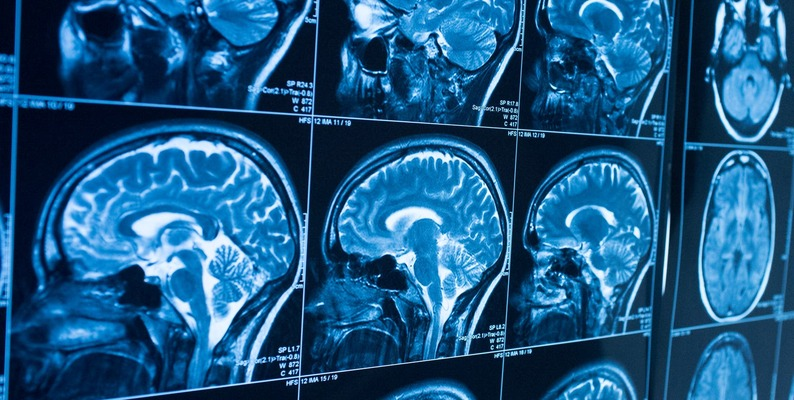

# What is a brain tumor?    
A brain tumor is a collection, or mass, of abnormal cells in your brain. Your skull, which encloses your brain, is very rigid. Any growth inside such
     a restricted space can cause problems. Brain tumors can be cancerous (malignant) or noncancerous (benign). When benign or malignant tumors grow, they
     can cause the pressure inside your skull to increase. This can cause brain damage, and it can be life-threatening
 tumor.

> import libraries

In [1]:
# Import libraries for image processing, data handling, and machine learning
import cv2
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skimage import feature
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Import machine learning models
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,VotingClassifier
from xgboost import XGBClassifier

# Import metrics for evaluating model performance
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Set seaborn theme for better plots
sns.set_theme(style="white", rc={'figure.figsize': (11.7, 8.27)})

# Ignore warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


In [2]:
def extract_hog_features(image_path):
    image = cv2.imread(image_path)
    
    # Check if the image is loaded correctly
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Resize image and convert to grayscale
    resized_image = cv2.resize(image, (128, 128))
    gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
    
    # Extract HOG features
    hog_features = feature.hog(gray_image, pixels_per_cell=(16, 16), cells_per_block=(2, 2), visualize=False)
    
    return hog_features


In [3]:
features_list = []
targets = []

# Define paths to NORMAL and PNEUMONIA image folders and their corresponding target values
folder_paths = [
    'C:\\Users\\user\\Desktop\\project_models\\Tumor Detection\\Brain Tumor MRI Dataset\\Training\glioma',
    'C:\\Users\\user\\Desktop\\project_models\\Tumor Detection\\Brain Tumor MRI Dataset\\Training\\meningioma',
    'C:\\Users\\user\\Desktop\\project_models\\Tumor Detection\\Brain Tumor MRI Dataset\\Training\\notumor',
    'C:\\Users\\user\\Desktop\\project_models\\Tumor Detection\\Brain Tumor MRI Dataset\\Training\\pituitary'
]
target_values = [1, 2,0,3]  # 1 for glioma, 2 for meningioma ,0 for notumor, 3 for pituitary

# Loop through each folder and corresponding target value
for folder_path, target in zip(folder_paths, target_values):
    for filename in os.listdir(folder_path):  # Loop through each file in the folder
        if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'): 
            image_path = os.path.join(folder_path, filename)  # Full path to the image
            try:
                # Extract HOG features and append to lists
                features = extract_hog_features(image_path)
                features_list.append(features)
                targets.append(target)  
            except FileNotFoundError as e:
                print(e)  # Handle file not found errors


In [4]:
def display_images_with_folder_name(folder_path):
    images = []
    filenames = [filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.jpeg', '.png'))]
    
    for filename in filenames:
        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path)
        if image is not None:
            images.append(image)
    
    plt.figure(figsize=(12, 12))
    for i in range(min(4, len(images))):
        plt.subplot(4, 4, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.axis('on')
        plt.title(os.path.basename(folder_path))
    
    plt.tight_layout()
    plt.show()

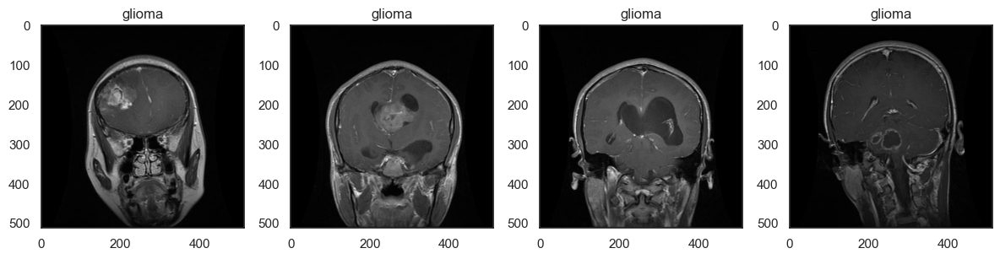

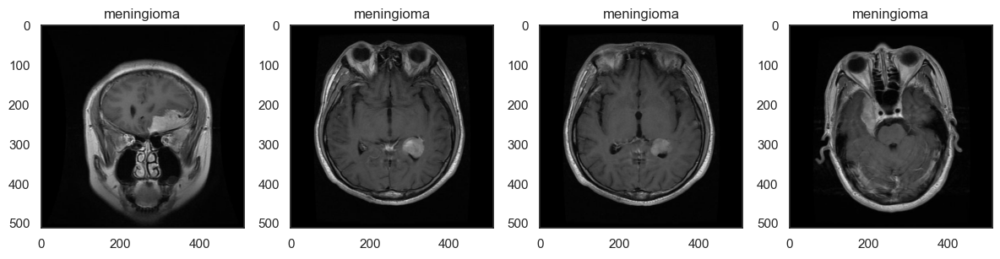

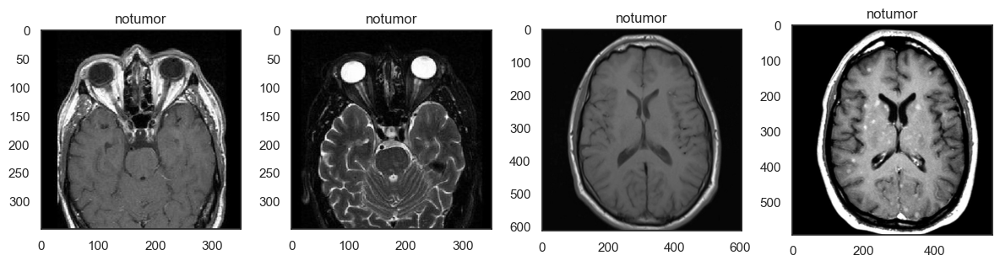

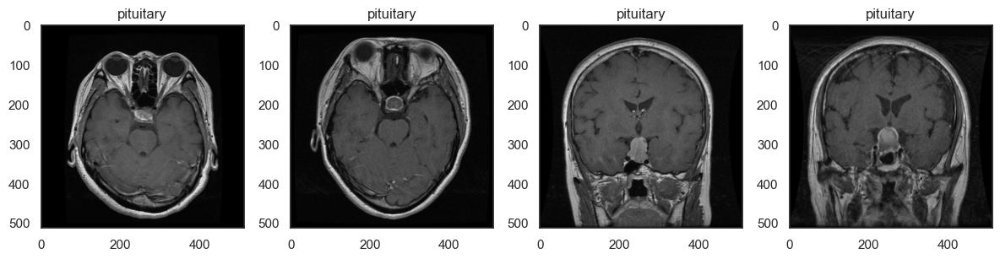

In [5]:
for folder_path in folder_paths:
   display_images_with_folder_name(folder_path)

> Data preprocessing

In [6]:
features_list

[array([0.29259513, 0.020513  , 0.11676202, ..., 0.02409423, 0.0213162 ,
        0.01945133]),
 array([0.26420466, 0.        , 0.06993635, ..., 0.01450492, 0.01417394,
        0.00931019]),
 array([0.25562317, 0.        , 0.07683645, ..., 0.02237318, 0.02079944,
        0.00672532]),
 array([0.0773025 , 0.        , 0.00560627, ..., 0.01722662, 0.0462652 ,
        0.01711995]),
 array([0.03106191, 0.        , 0.00518516, ..., 0.01116913, 0.07828441,
        0.03799192]),
 array([0.04899833, 0.00227488, 0.00863258, ..., 0.04288349, 0.0684838 ,
        0.05422792]),
 array([0.02854369, 0.        , 0.00722699, ..., 0.00990403, 0.01158555,
        0.00776836]),
 array([0.0238793 , 0.00197169, 0.00124701, ..., 0.03258946, 0.03119601,
        0.0242434 ]),
 array([0.02653312, 0.00136432, 0.00172574, ..., 0.01068136, 0.01186716,
        0.00393039]),
 array([0.12459216, 0.02266751, 0.01792024, ..., 0.00861567, 0.0343692 ,
        0.00642174]),
 array([0.03557501, 0.00241055, 0.01150972, ..., 0

In [7]:
for i, features in enumerate(features_list):
    print(f"Feature {i} shape: {features.shape}")
    if i==10:
        break


Feature 0 shape: (1764,)
Feature 1 shape: (1764,)
Feature 2 shape: (1764,)
Feature 3 shape: (1764,)
Feature 4 shape: (1764,)
Feature 5 shape: (1764,)
Feature 6 shape: (1764,)
Feature 7 shape: (1764,)
Feature 8 shape: (1764,)
Feature 9 shape: (1764,)
Feature 10 shape: (1764,)


In [8]:
X = np.array(features_list)
y = np.array(targets)
data = pd.DataFrame(X, columns=[f'feature_{i}' for i in range(1764)])
data['target'] = y

In [9]:
data.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1755,feature_1756,feature_1757,feature_1758,feature_1759,feature_1760,feature_1761,feature_1762,feature_1763,target
0,0.292595,0.020513,0.116762,0.000000,0.292595,0.029010,0.240472,0.173331,0.191687,0.229342,...,0.029009,0.001656,0.004190,0.003313,0.032593,0.000000,0.024094,0.021316,0.019451,1
1,0.264205,0.000000,0.069936,0.018430,0.264205,0.062815,0.058280,0.264205,0.146281,0.264205,...,0.027996,0.005175,0.004120,0.003321,0.024676,0.000000,0.014505,0.014174,0.009310,1
2,0.255623,0.000000,0.076836,0.000000,0.240611,0.000000,0.170681,0.255623,0.098178,0.255623,...,0.019485,0.006402,0.011023,0.004274,0.013423,0.006059,0.022373,0.020799,0.006725,1
3,0.077302,0.000000,0.005606,0.000000,0.051535,0.000000,0.028031,0.048033,0.000000,0.041624,...,0.070379,0.006053,0.009570,0.015132,0.036543,0.022438,0.017227,0.046265,0.017120,1
4,0.031062,0.000000,0.005185,0.005526,0.011756,0.004274,0.008709,0.029152,0.010622,0.037778,...,0.107410,0.016291,0.022338,0.042669,0.048966,0.017660,0.011169,0.078284,0.037992,1


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5712 entries, 0 to 5711
Columns: 1765 entries, feature_0 to target
dtypes: float64(1764), int32(1)
memory usage: 76.9 MB


In [11]:
data.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1755,feature_1756,feature_1757,feature_1758,feature_1759,feature_1760,feature_1761,feature_1762,feature_1763,target
count,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,...,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000,5712.000000
mean,0.074724,0.014444,0.030273,0.023701,0.080050,0.016633,0.034185,0.026321,0.016838,0.104526,...,0.088410,0.030917,0.030012,0.026573,0.062880,0.021055,0.028204,0.029024,0.030656,1.465336
std,0.101374,0.031285,0.050275,0.038073,0.103873,0.029357,0.060473,0.053978,0.039722,0.122618,...,0.101824,0.057061,0.047363,0.042183,0.083055,0.037745,0.046193,0.050511,0.058427,1.147892
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.002942,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022184,...,0.018325,0.000000,0.000000,0.000000,0.000541,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.028839,0.003998,0.013091,0.008918,0.038421,0.005434,0.010766,0.004211,0.000000,0.050639,...,0.049355,0.009538,0.014797,0.012524,0.036388,0.008862,0.014265,0.010048,0.007298,1.000000
75%,0.093726,0.016403,0.034949,0.031069,0.108168,0.021358,0.033097,0.022811,0.014902,0.138924,...,0.119776,0.028391,0.034368,0.033955,0.082413,0.025463,0.033052,0.032205,0.028492,3.000000
max,0.704527,0.435276,0.489251,0.359079,0.567647,0.357341,0.398819,0.322887,0.434462,0.707107,...,0.635264,0.374238,0.438707,0.464719,0.558361,0.422299,0.422299,0.363684,0.488283,3.000000


In [12]:
data.target.value_counts()

target
0    1595
3    1457
2    1339
1    1321
Name: count, dtype: int64

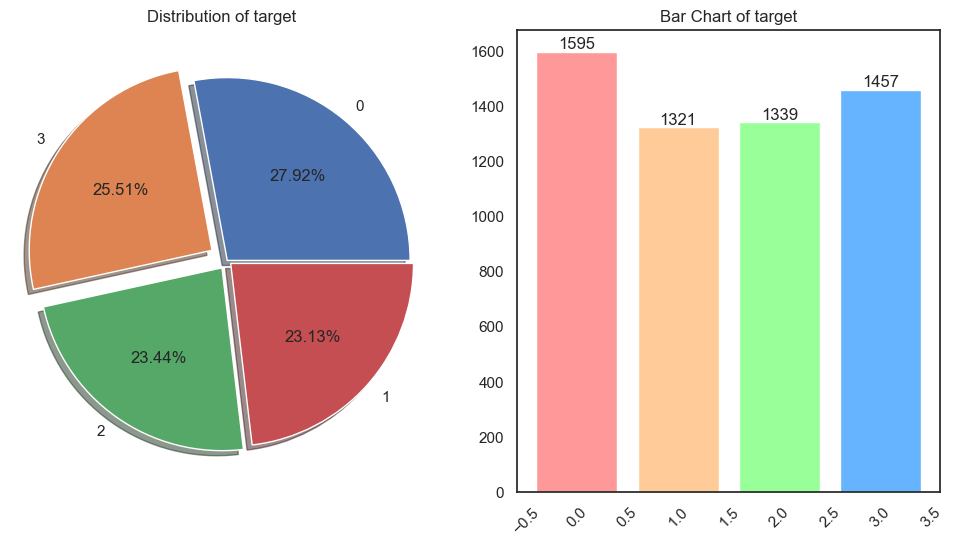

In [13]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.pie(
    x=data.target.value_counts().values, 
    labels=data.target.value_counts().index, 
    shadow=True, 
    explode=[0, 0.1, 0.05, 0.025], 
    autopct="%.2f%%"
)
plt.title('Distribution of target')
plt.axis('equal')

plt.subplot(1, 2, 2)
counts = data.target.value_counts()
colors = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99']
bars = plt.bar(height=counts.values, x=counts.index, color=colors)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval}', ha='center', va='bottom')

plt.title('Bar Chart of target')
plt.xticks(rotation=45)
plt.show()

In [14]:
data_missing=pd.DataFrame(data.isnull().sum())
data_missing

,0
feature_0,0
feature_1,0
feature_2,0
feature_3,0
feature_4,0
...,...
feature_1760,0
feature_1761,0
feature_1762,0
feature_1763,0


In [15]:
data_missing.max()

0    0
dtype: int64

In [16]:
data.duplicated().sum()

207

In [17]:
data.drop_duplicates(inplace=True)

In [18]:
data.duplicated().sum()

0

In [19]:
corr_data=data.corr()
corr_data

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1755,feature_1756,feature_1757,feature_1758,feature_1759,feature_1760,feature_1761,feature_1762,feature_1763,target
feature_0,1.000000,0.325616,0.468351,0.486727,0.723919,0.462392,0.650074,0.571858,0.600906,0.141312,...,0.263146,-0.028820,0.037947,0.068793,0.315486,0.091775,0.155721,0.116698,0.074867,-0.114021
feature_1,0.325616,1.000000,0.568828,0.405519,0.282302,0.364207,0.199539,0.215461,0.373460,-0.002393,...,0.190366,0.233138,0.234107,0.215498,0.233746,0.170592,0.107924,0.113470,0.163698,0.087262
feature_2,0.468351,0.568828,1.000000,0.580132,0.542019,0.456830,0.600897,0.435586,0.292090,0.059706,...,0.094686,0.176266,0.289820,0.227611,0.266693,0.205133,0.244352,0.213765,0.138530,0.121152
feature_3,0.486727,0.405519,0.580132,1.000000,0.616500,0.734020,0.576565,0.490682,0.440792,0.009912,...,0.092889,0.116134,0.173819,0.183959,0.262554,0.184944,0.227568,0.199416,0.116655,0.141906
feature_4,0.723919,0.282302,0.542019,0.616500,1.000000,0.545210,0.698523,0.564509,0.506112,0.004406,...,0.183006,0.011380,0.104197,0.138216,0.382917,0.177096,0.249339,0.191855,0.118328,-0.000931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
feature_1760,0.091775,0.170592,0.205133,0.184944,0.177096,0.168692,0.164708,0.134261,0.102117,-0.148399,...,0.234870,0.320857,0.458361,0.693749,0.628791,1.000000,0.724552,0.604897,0.442481,0.184266
feature_1761,0.155721,0.107924,0.244352,0.227568,0.249339,0.184761,0.276900,0.210834,0.093108,-0.126984,...,0.282244,0.251404,0.474465,0.615301,0.619618,0.724552,1.000000,0.770036,0.476857,0.179492
feature_1762,0.116698,0.113470,0.213765,0.199416,0.191855,0.170705,0.235342,0.251263,0.126619,-0.128584,...,0.316420,0.326298,0.439023,0.578845,0.465112,0.604897,0.770036,1.000000,0.642405,0.243846
feature_1763,0.074867,0.163698,0.138530,0.116655,0.118328,0.111132,0.041024,0.067307,0.100237,-0.160944,...,0.518864,0.482473,0.427939,0.496943,0.372118,0.442481,0.476857,0.642405,1.000000,0.223042


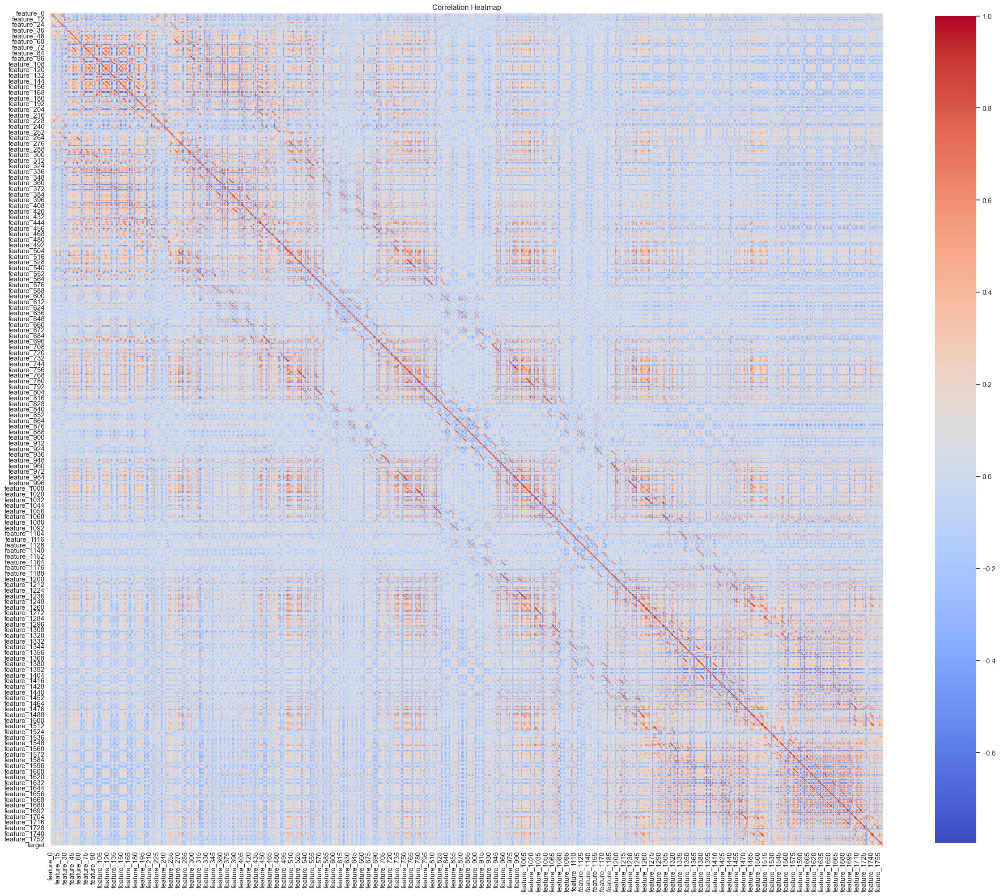

In [20]:
plt.figure(figsize=(30, 30))
sns.heatmap(corr_data, annot=False, cmap='coolwarm', fmt=".2f", square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap')
plt.show()

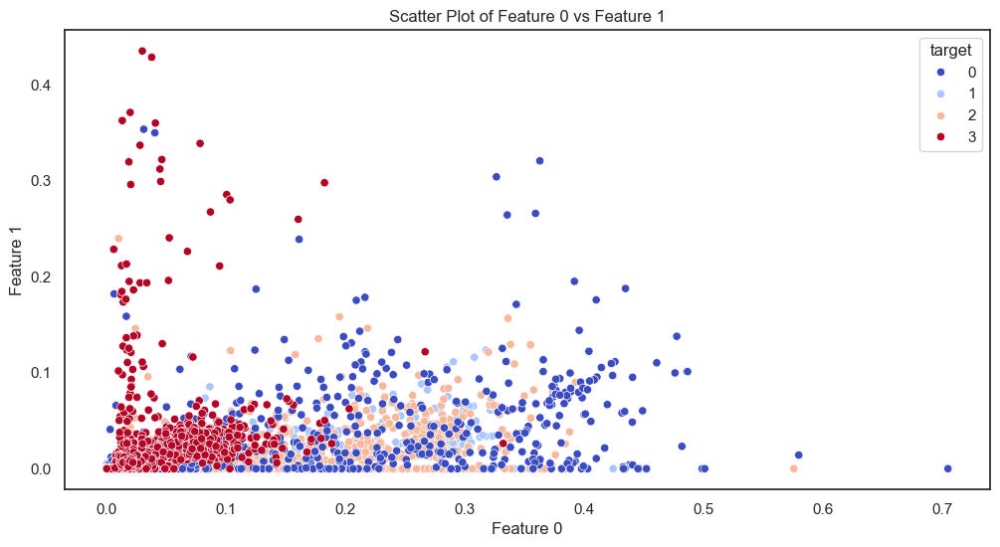

In [21]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=data, x='feature_0', y='feature_1', hue='target', palette='coolwarm')
plt.title('Scatter Plot of Feature 0 vs Feature 1')
plt.xlabel('Feature 0')
plt.ylabel('Feature 1')
plt.show()

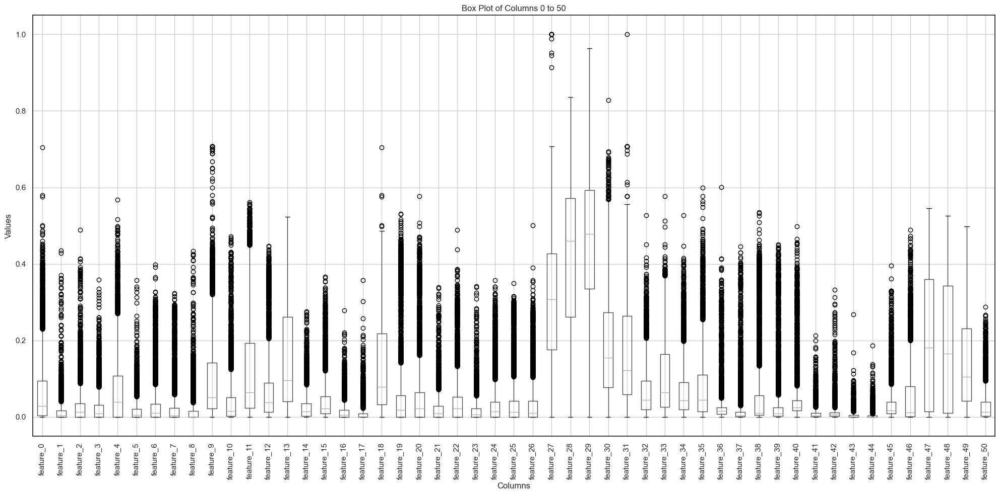

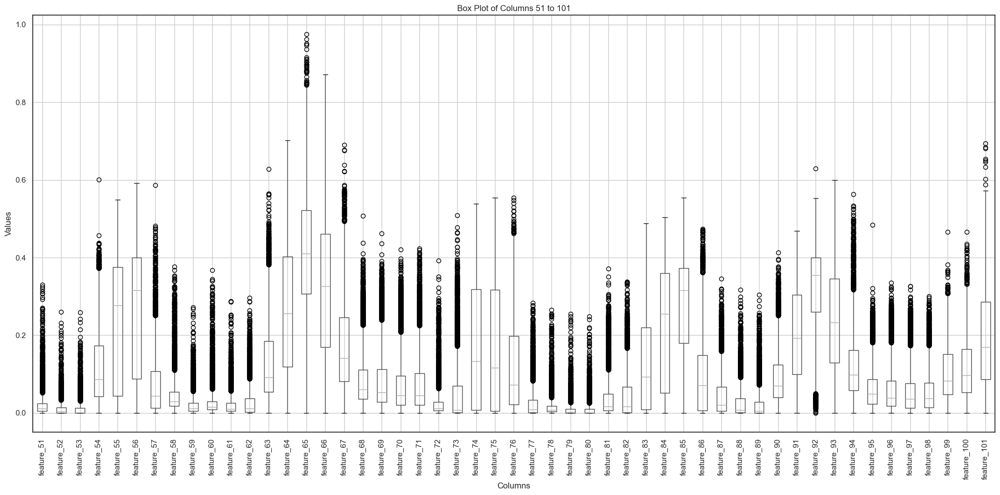

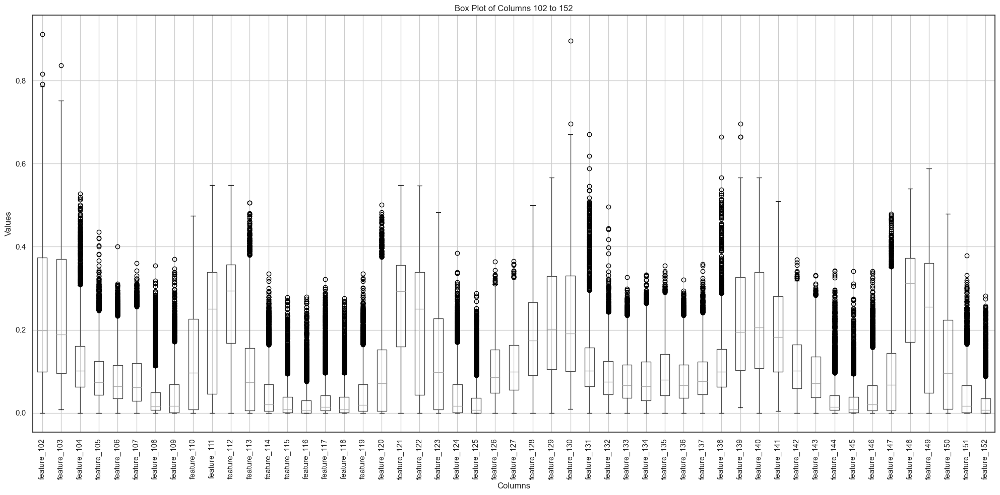

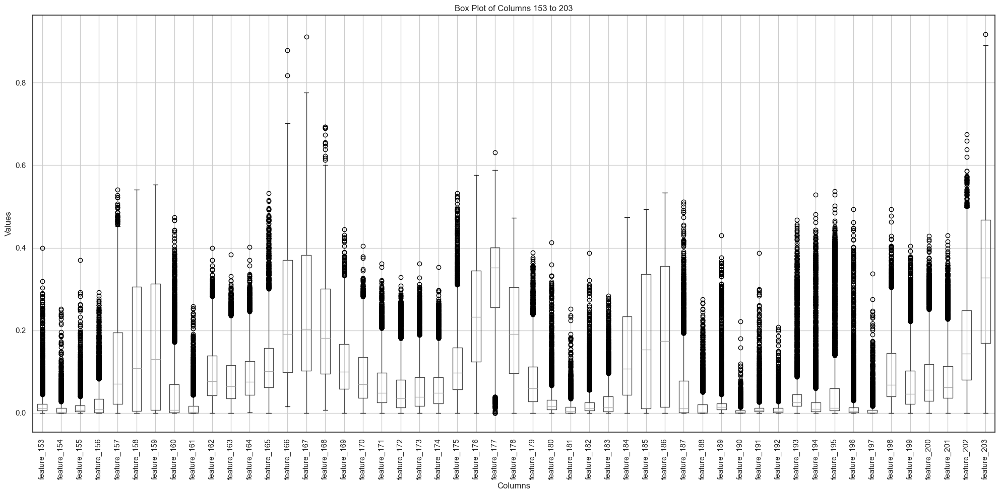

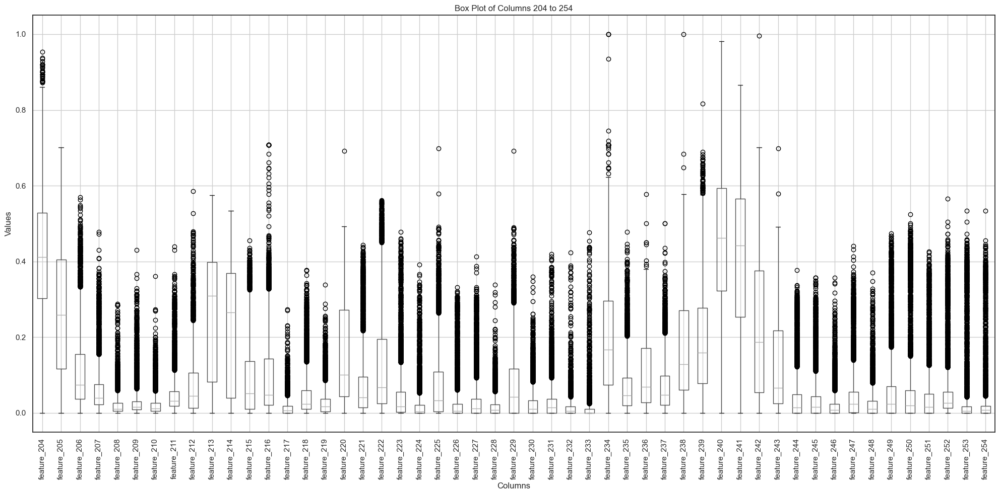

...

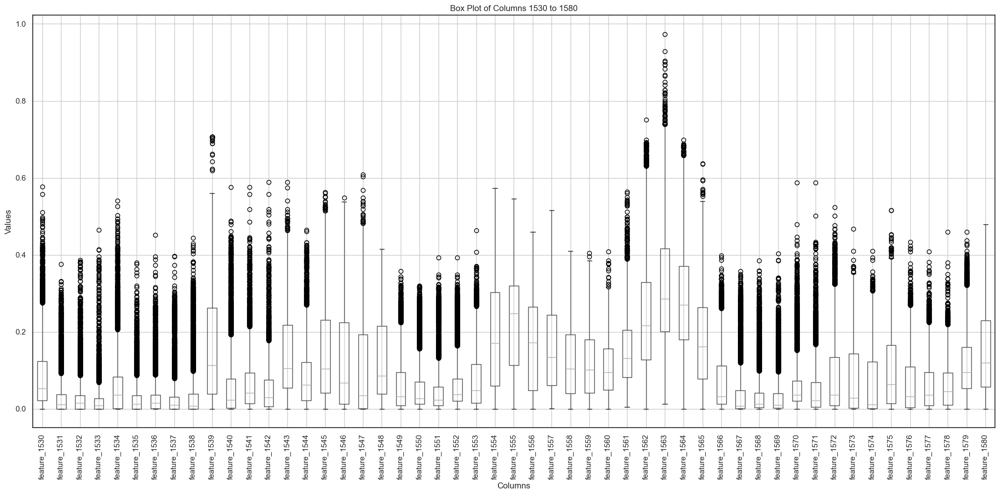

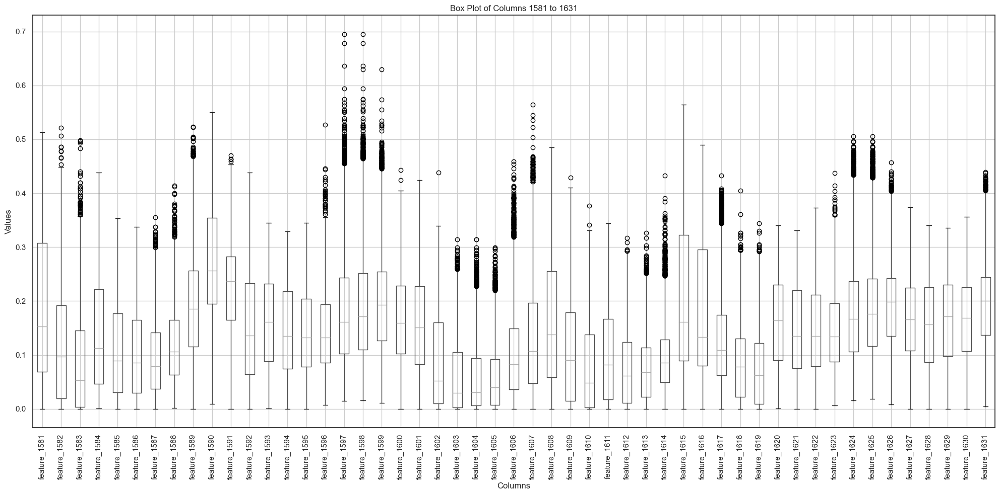

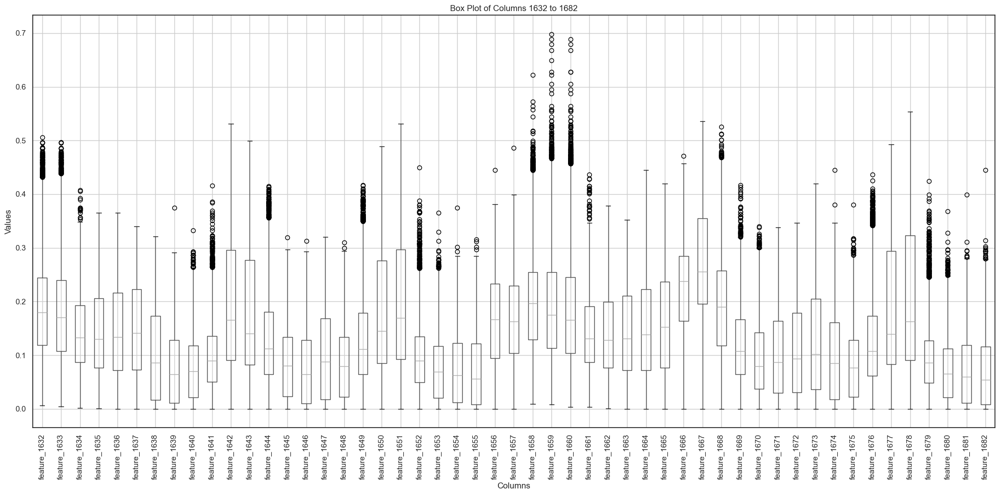

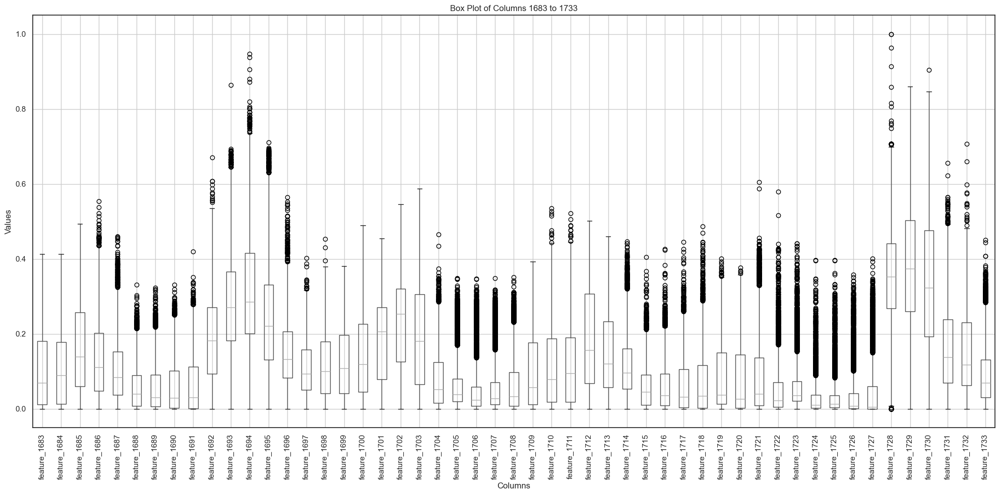

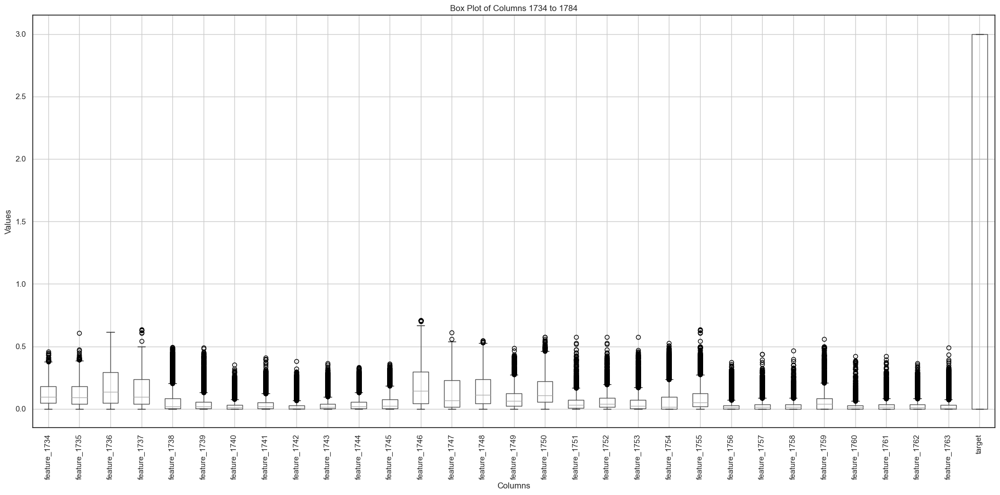

In [22]:
for i in range(0, 1764, 51):  
    plt.figure(figsize=(20, 10))  
    data_subset = data.iloc[:, i:i+51]  #boxplot to show outliners of columns
    
    data_subset.boxplot()
    
    plt.title(f'Box Plot of Columns {i} to {i+50}')
    plt.xlabel('Columns')
    plt.ylabel('Values')
    plt.xticks(rotation=90)  
    
    plt.tight_layout()  
    plt.show()

In [23]:
features_data=data.drop(["target"],axis=1)
target_data=data["target"]

In [24]:
def replace_outliers_with_median(df):
    for col in df.columns:
        Q1 = df[col].quantile(0.25)  # First quartile
        Q3 = df[col].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1  # Interquartile range
        
        lower_bound = Q1 - 1.5 * IQR  # Lower bound
        upper_bound = Q3 + 1.5 * IQR  # Upper bound
        
        median = df[col].median()  
        
        df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median, df[col])  # Replace outliers
    
    return df  

features_data = replace_outliers_with_median(features_data)  # Update features_data

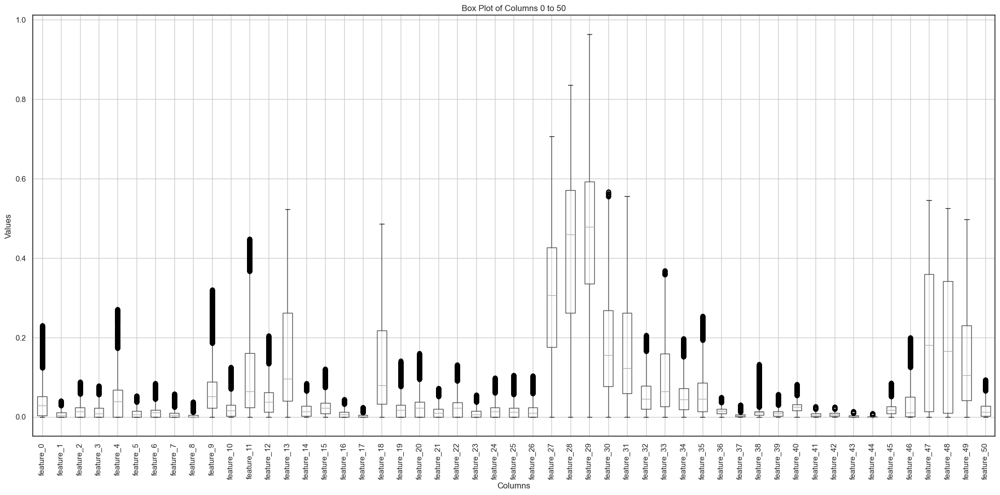

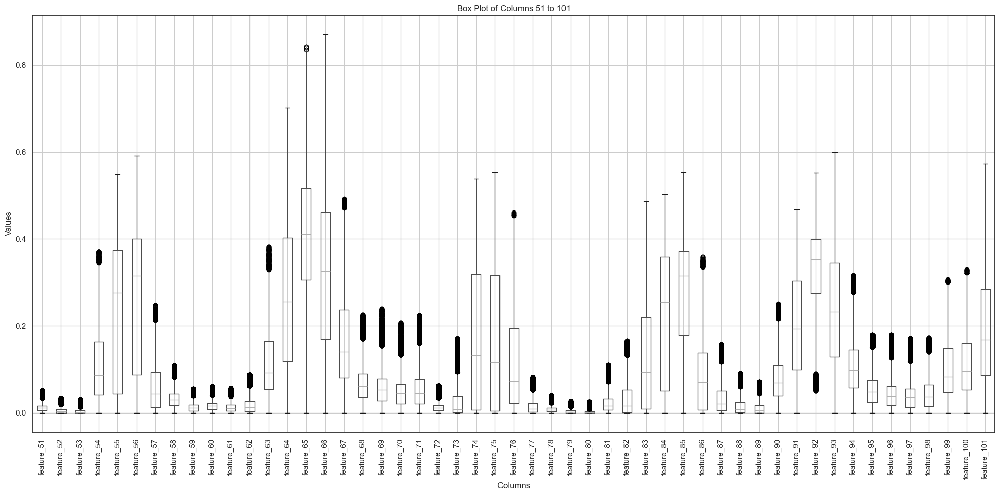

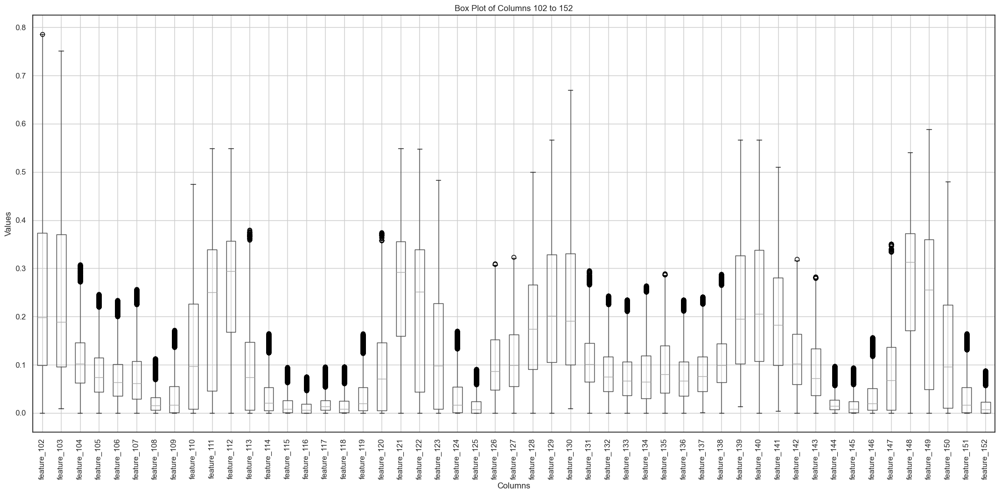

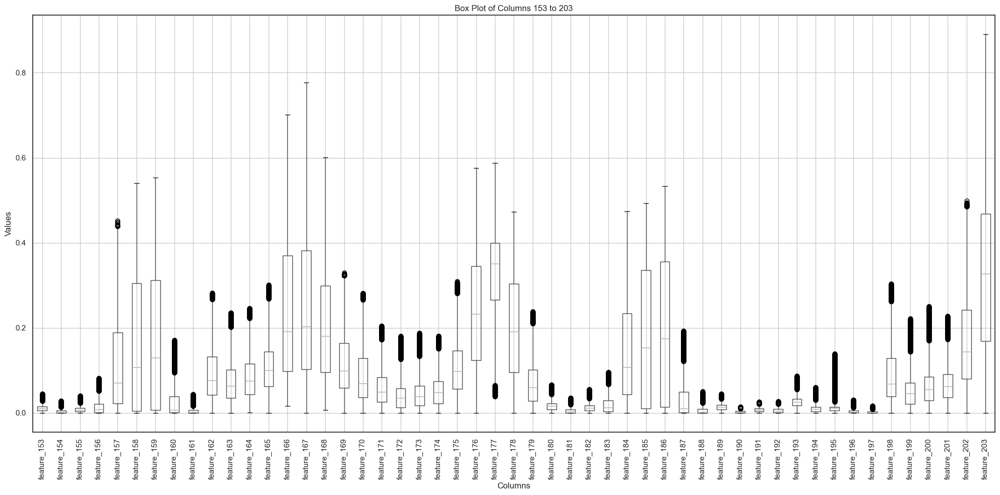

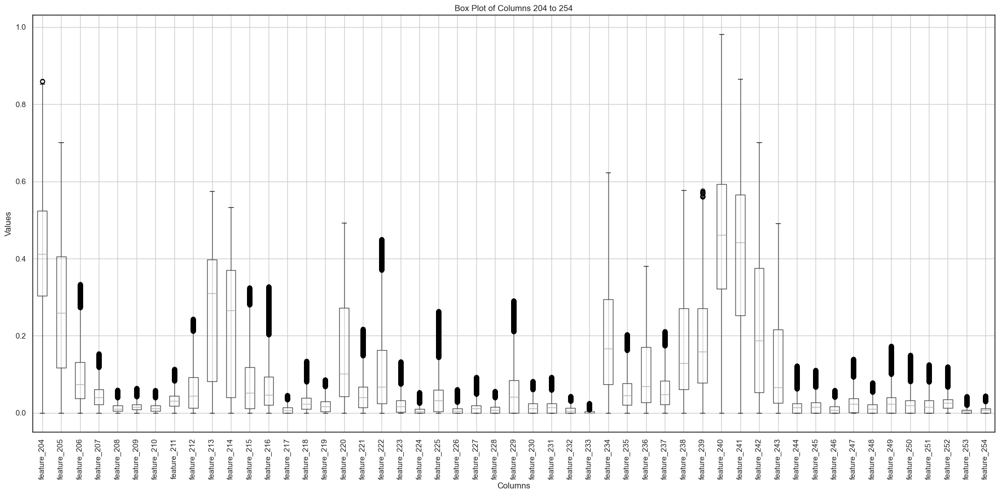

...

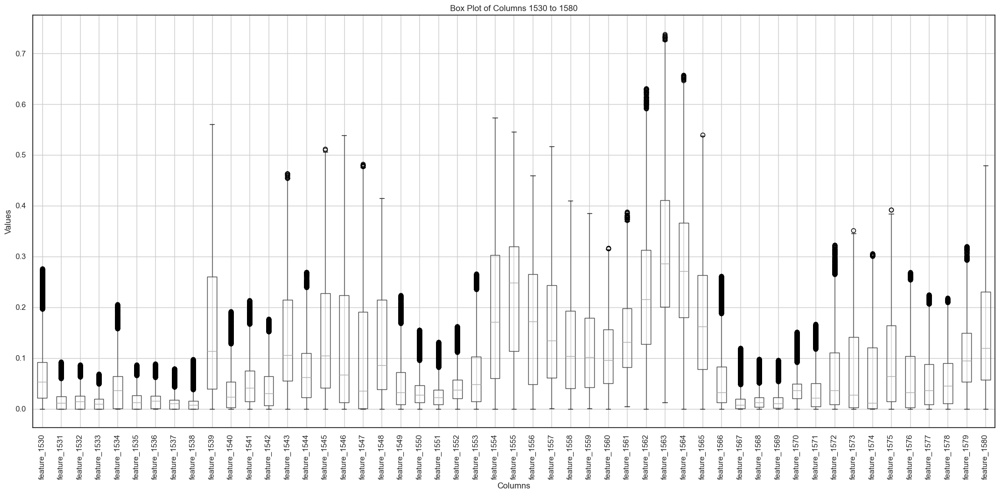

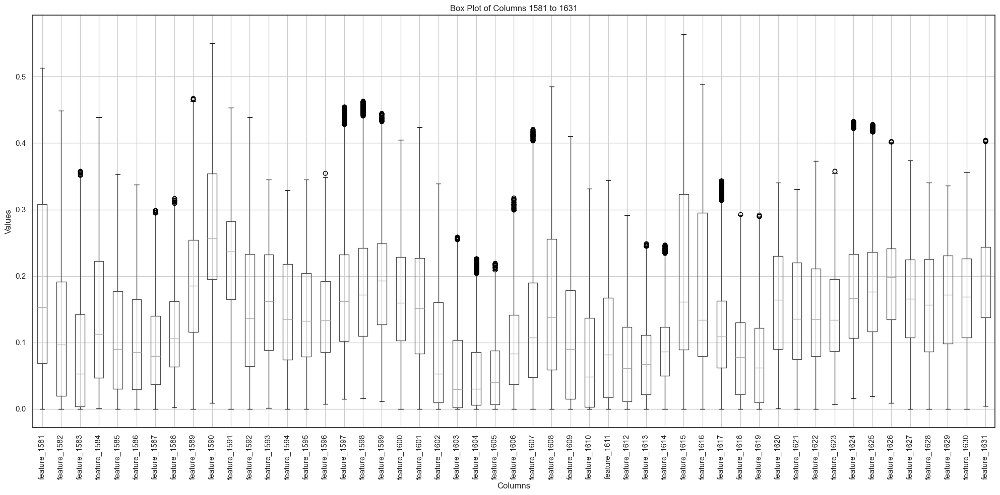

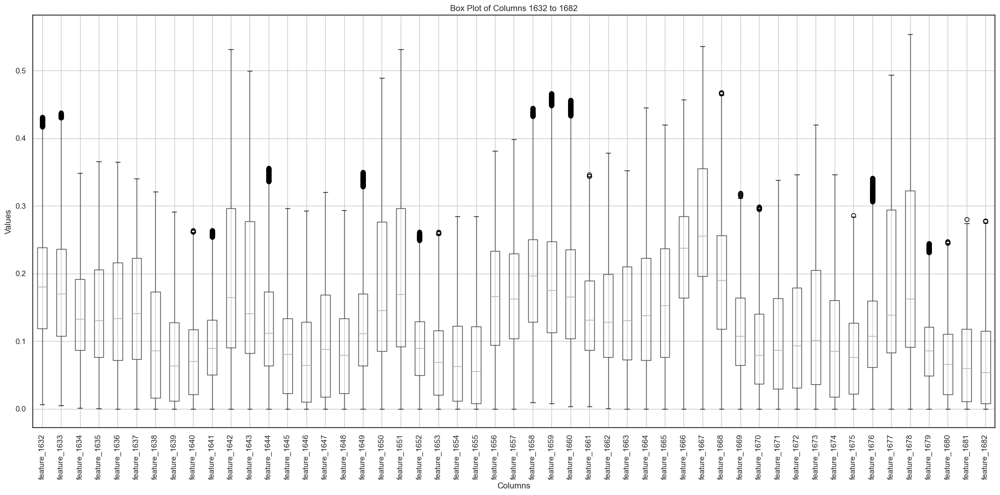

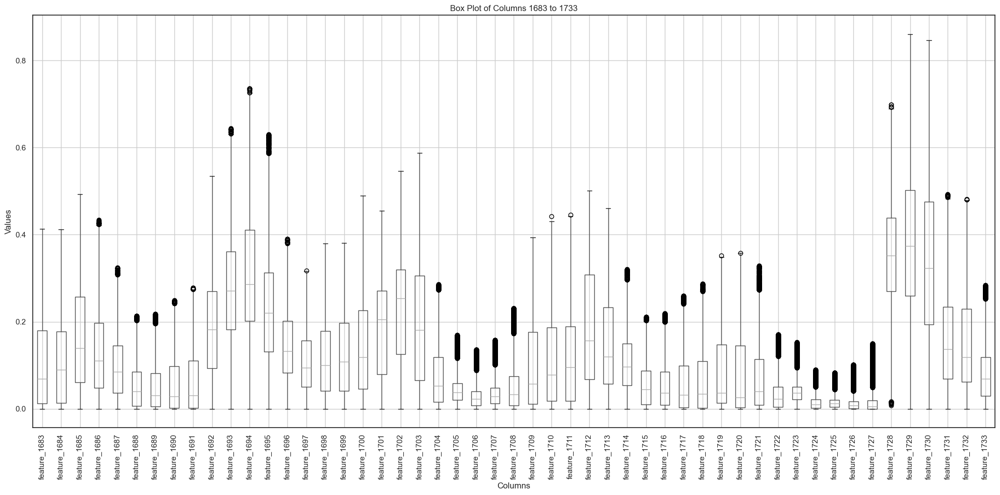

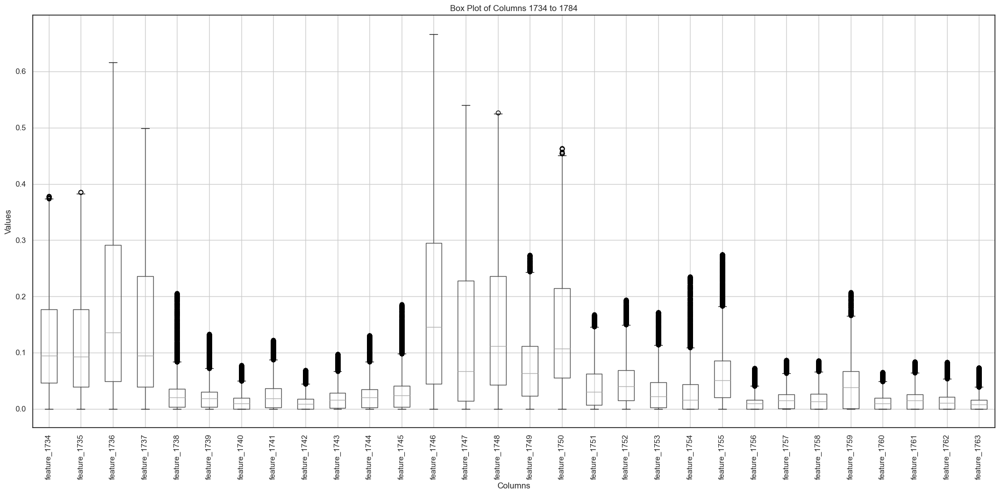

In [25]:
for i in range(0, 1763, 51):  
    plt.figure(figsize=(20, 10))  
    data_subset = features_data.iloc[:, i:i+51]   #boxplot to show outliners of columns after Update features_data
    
    data_subset.boxplot()
    
    plt.title(f'Box Plot of Columns {i} to {i+50}')
    plt.xlabel('Columns')
    plt.ylabel('Values')
    plt.xticks(rotation=90)  
    
    plt.tight_layout()  
    plt.show()

In [26]:
# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(features_data, target_data, test_size=0.3, random_state=42)  
# 'features_data' is the input data, 'target_data' is the labels.
# 30% of the data will be used for testing, and the rest for training.

x_train.head()  

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1754,feature_1755,feature_1756,feature_1757,feature_1758,feature_1759,feature_1760,feature_1761,feature_1762,feature_1763
2309,0.229355,0.026878,0.013464,0.059322,0.258430,0.005765,0.010988,0.004435,0.000000,0.120200,...,0.026868,0.022204,0.003972,0.005652,0.003972,0.019984,0.004810,0.012331,0.015342,0.001404
4218,0.020770,0.002152,0.004764,0.003228,0.090075,0.001984,0.004764,0.003228,0.000000,0.040577,...,0.000000,0.050631,0.003700,0.015211,0.004456,0.086196,0.000000,0.002340,0.001850,0.000000
5475,0.038299,0.002492,0.022916,0.028811,0.050181,0.028728,0.017677,0.013799,0.012461,0.028891,...,0.097061,0.035592,0.018839,0.028543,0.028306,0.074258,0.029481,0.035792,0.013674,0.013031
2251,0.029214,0.033459,0.013464,0.009407,0.269340,0.005765,0.010988,0.004435,0.000000,0.271600,...,0.081175,0.022531,0.003133,0.008421,0.009913,0.022768,0.009142,0.020582,0.016034,0.006983
2962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [27]:
x_test.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1754,feature_1755,feature_1756,feature_1757,feature_1758,feature_1759,feature_1760,feature_1761,feature_1762,feature_1763
3188,0.003449,0.001153,0.001817,0.003487,0.040424,0.004213,0.000404,0.000834,0.000451,0.008384,...,0.000744,0.001176,0.000000,0.000998,0.010456,0.037919,0.008296,0.001330,0.000000,0.000000
1199,0.144712,0.024891,0.073465,0.009407,0.141001,0.005765,0.010988,0.004435,0.000000,0.144712,...,0.015898,0.048726,0.005836,0.009569,0.019670,0.041894,0.013632,0.024752,0.027794,0.011065
5613,0.007868,0.007252,0.017285,0.017222,0.019340,0.005957,0.004600,0.001283,0.001394,0.006376,...,0.011956,0.037088,0.047635,0.015343,0.013433,0.037919,0.009471,0.014912,0.055578,0.015810
4752,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.276992,...,0.017999,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5444,0.043706,0.011806,0.021592,0.020655,0.062899,0.018228,0.020086,0.013208,0.014801,0.034493,...,0.015898,0.026410,0.011760,0.018204,0.018684,0.029773,0.019626,0.009926,0.016578,0.011718


In [28]:
y_train.head()

2309    2
4218    0
5475    3
2251    2
2962    0
Name: target, dtype: int32

# ML Models

KNN Accuracy: 0.9340193704600485
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       402
           1       0.94      0.93      0.93       432
           2       0.89      0.86      0.88       378
           3       0.94      0.99      0.97       440

    accuracy                           0.93      1652
   macro avg       0.93      0.93      0.93      1652
weighted avg       0.93      0.93      0.93      1652



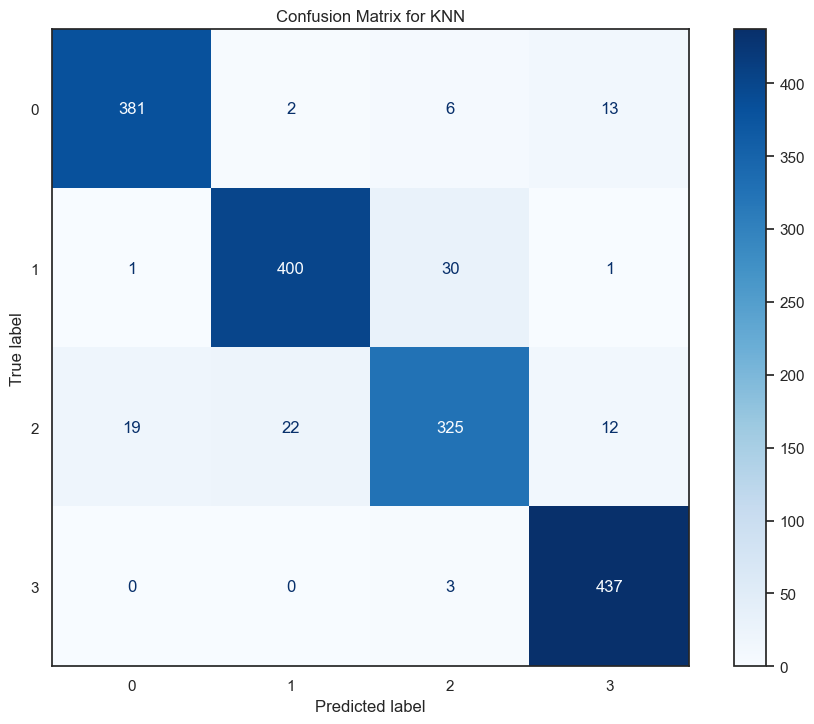

In [29]:
knn_model = KNeighborsClassifier()
knn_param_grid = {
    "n_neighbors": np.arange(1, 20),
    "weights": ['uniform', 'distance']
}
knn_search = GridSearchCV(estimator=knn_model, param_grid=knn_param_grid, cv=5, n_jobs=-1)
knn_search.fit(x_train, y_train)
best_knn_model = knn_search.best_estimator_
y_pred_knn = best_knn_model.predict(x_test)

print(f"KNN Accuracy: {accuracy_score(y_test, y_pred_knn)}")
print(classification_report(y_test, y_pred_knn))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_knn)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for KNN')
plt.show()

SVC Accuracy: 0.9309927360774818
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       402
           1       0.93      0.91      0.92       432
           2       0.88      0.84      0.86       378
           3       0.96      0.99      0.97       440

    accuracy                           0.93      1652
   macro avg       0.93      0.93      0.93      1652
weighted avg       0.93      0.93      0.93      1652



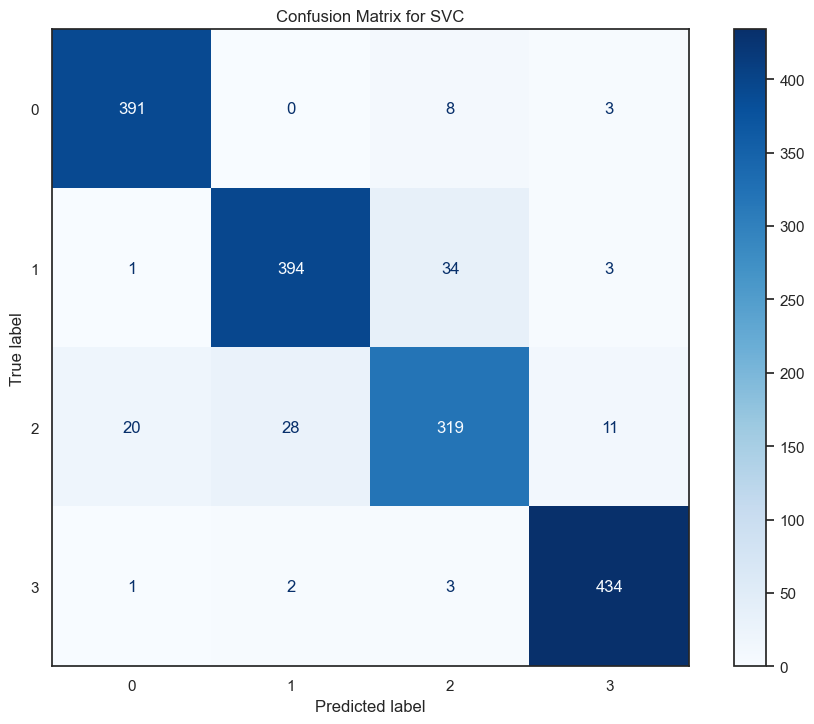

In [30]:
svc_model = SVC()
svc_param_grid = {
    "C": [0.1, 1, 10, 100],
    "kernel": ['linear', 'rbf', 'poly'],
    "gamma": ['scale', 'auto']
}
svc_search = GridSearchCV(estimator=svc_model, param_grid=svc_param_grid, cv=5, n_jobs=-1)
svc_search.fit(x_train, y_train)
best_svc_model = svc_search.best_estimator_
y_pred_svc = best_svc_model.predict(x_test)

print(f"SVC Accuracy: {accuracy_score(y_test, y_pred_svc)}")
print(classification_report(y_test, y_pred_svc))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_svc)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for SVC')
plt.show()

Decision Tree Accuracy: 0.7288135593220338
              precision    recall  f1-score   support

           0       0.82      0.79      0.81       402
           1       0.74      0.72      0.73       432
           2       0.57      0.61      0.59       378
           3       0.78      0.79      0.78       440

    accuracy                           0.73      1652
   macro avg       0.73      0.73      0.73      1652
weighted avg       0.73      0.73      0.73      1652



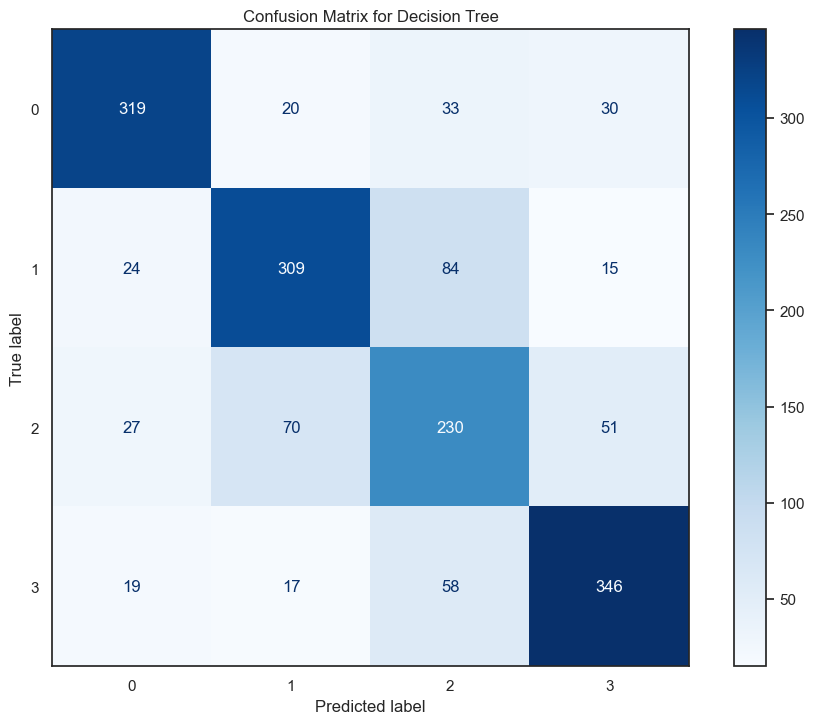

In [31]:
tree_model = DecisionTreeClassifier(criterion='gini', max_depth=50, 
                                    max_features=7)
tree_model.fit(x_train, y_train)
y_pred_tree = tree_model.predict(x_test)

print(f"Decision Tree Accuracy: {accuracy_score(y_test, y_pred_tree)}")
print(classification_report(y_test, y_pred_tree))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_tree)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Decision Tree')
plt.show()

Random Forest Accuracy: 0.8819612590799032
              precision    recall  f1-score   support

           0       0.91      0.94      0.92       402
           1       0.93      0.84      0.88       432
           2       0.81      0.79      0.80       378
           3       0.88      0.95      0.91       440

    accuracy                           0.88      1652
   macro avg       0.88      0.88      0.88      1652
weighted avg       0.88      0.88      0.88      1652



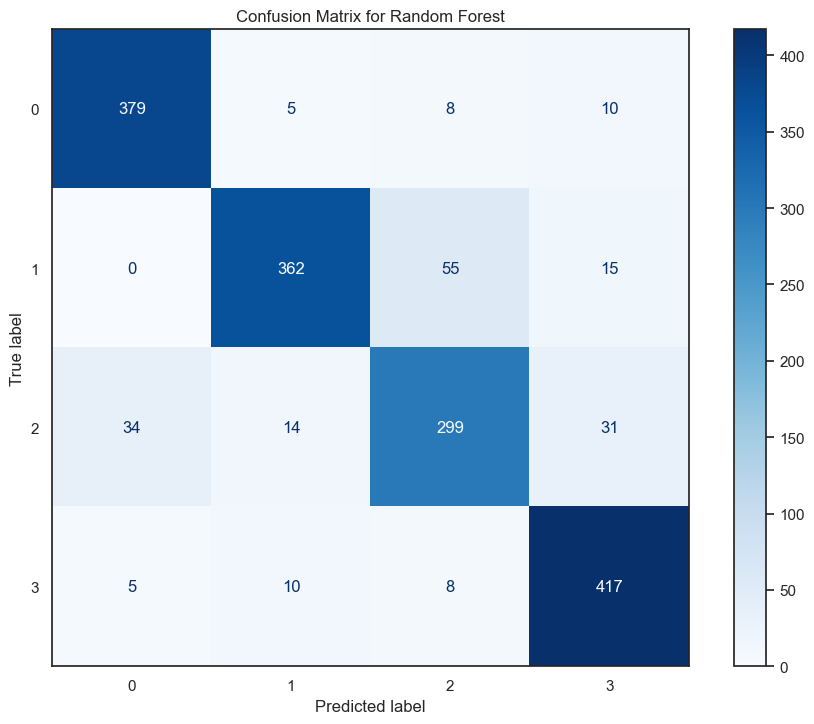

In [32]:
rfc_model = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=50, 
                                    max_features=7)

rfc_model.fit(x_train, y_train)
y_pred_forest = rfc_model.predict(x_test)

print(f"Random Forest Accuracy: {accuracy_score(y_test, y_pred_forest)}")
print(classification_report(y_test, y_pred_forest))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_forest)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Random Forest')
plt.show()

AdaBoost Accuracy: 0.7439467312348669
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       402
           1       0.67      0.91      0.77       432
           2       0.58      0.38      0.46       378
           3       0.81      0.80      0.81       440

    accuracy                           0.74      1652
   macro avg       0.74      0.73      0.73      1652
weighted avg       0.74      0.74      0.73      1652



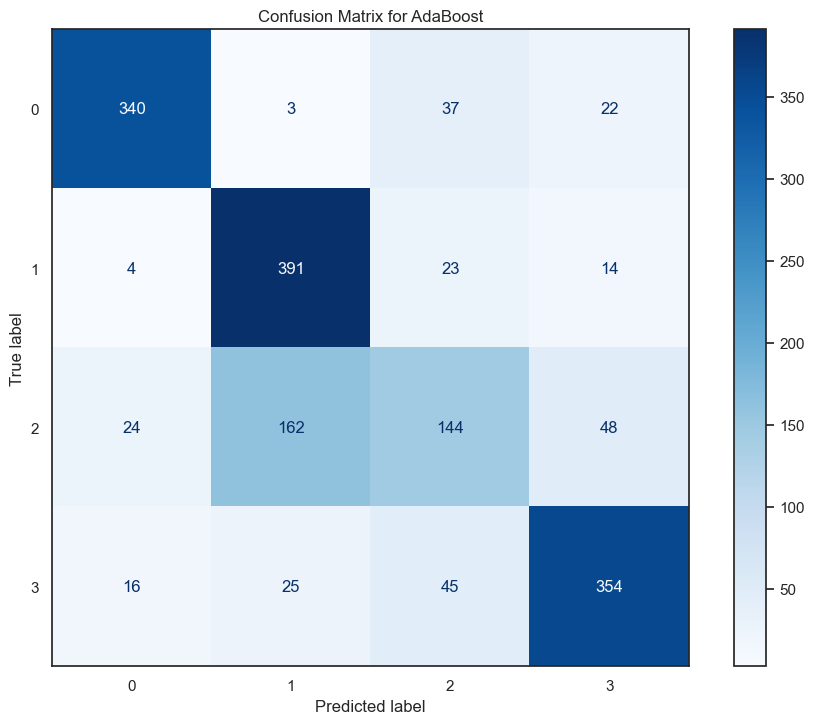

In [33]:
ada_model = AdaBoostClassifier(n_estimators=100, learning_rate=1.0)
ada_model.fit(x_train, y_train)

y_pred_ada = ada_model.predict(x_test)

print(f"AdaBoost Accuracy: {accuracy_score(y_test, y_pred_ada)}")
print(classification_report(y_test, y_pred_ada))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_ada)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for AdaBoost')
plt.show()

Gradient Boosting Accuracy: 0.8970944309927361
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       402
           1       0.93      0.86      0.90       432
           2       0.84      0.79      0.82       378
           3       0.89      0.97      0.93       440

    accuracy                           0.90      1652
   macro avg       0.90      0.89      0.89      1652
weighted avg       0.90      0.90      0.90      1652



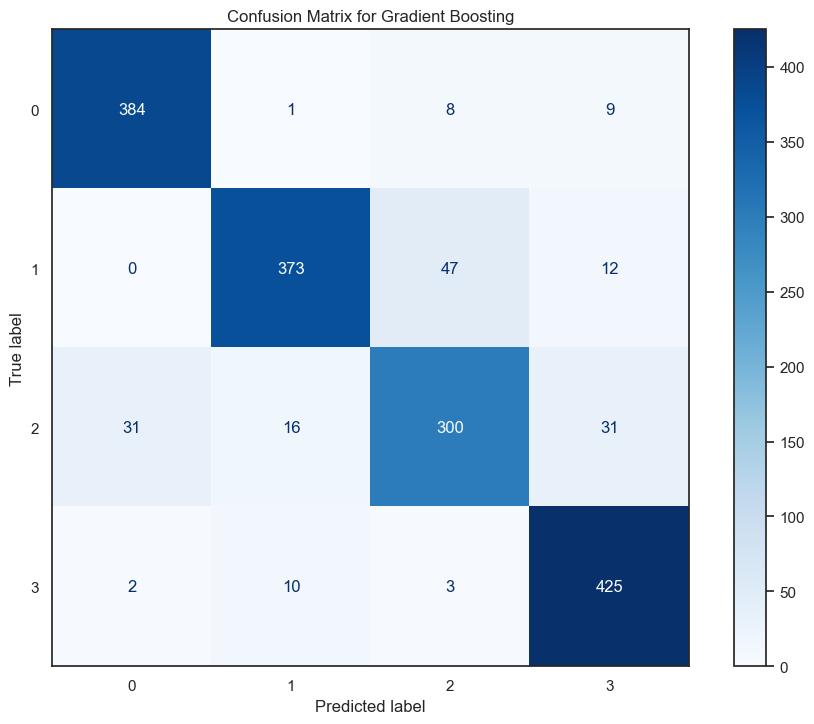

In [34]:
grad_model = GradientBoostingClassifier(n_estimators=100, max_depth=50, 
                                    max_features=7)
grad_model.fit(x_train, y_train)

y_pred_grad = grad_model.predict(x_test)

print(f"Gradient Boosting Accuracy: {accuracy_score(y_test, y_pred_grad)}")
print(classification_report(y_test, y_pred_grad))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_grad)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Gradient Boosting')
plt.show()

XGBoost Accuracy: 0.9073849878934624
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       402
           1       0.94      0.88      0.91       432
           2       0.85      0.82      0.84       378
           3       0.91      0.96      0.93       440

    accuracy                           0.91      1652
   macro avg       0.91      0.91      0.91      1652
weighted avg       0.91      0.91      0.91      1652



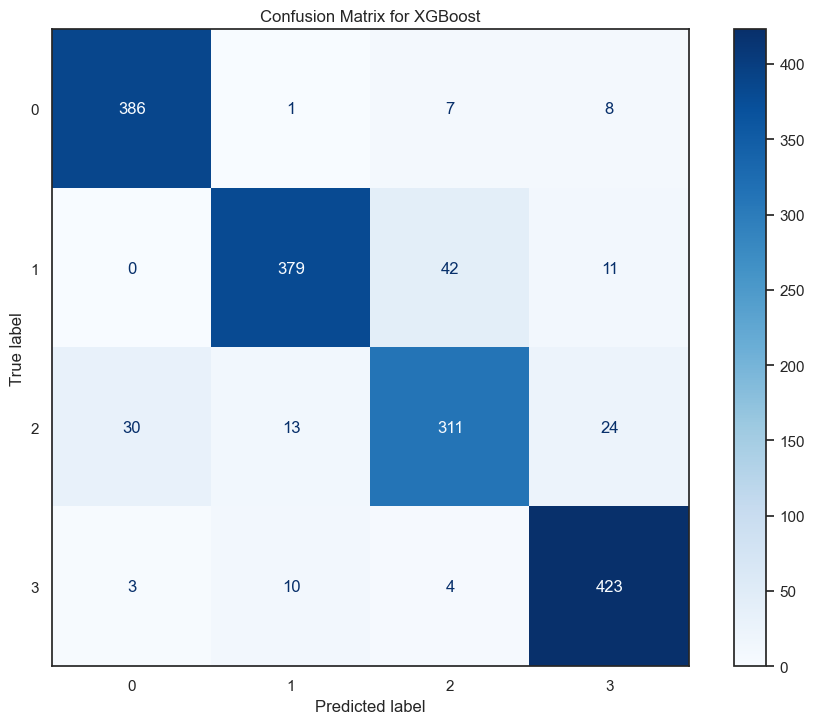

In [35]:
xg_model = XGBClassifier()
xg_model.fit(x_train, y_train)
y_pred_xg = xg_model.predict(x_test)

print(f"XGBoost Accuracy: {accuracy_score(y_test, y_pred_xg)}")
print(classification_report(y_test, y_pred_xg))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_xg)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for XGBoost')
plt.show()

Voting Classifier Accuracy: 0.9128329297820823
              precision    recall  f1-score   support

           0       0.93      0.96      0.95       402
           1       0.94      0.89      0.92       432
           2       0.86      0.83      0.84       378
           3       0.91      0.96      0.93       440

    accuracy                           0.91      1652
   macro avg       0.91      0.91      0.91      1652
weighted avg       0.91      0.91      0.91      1652



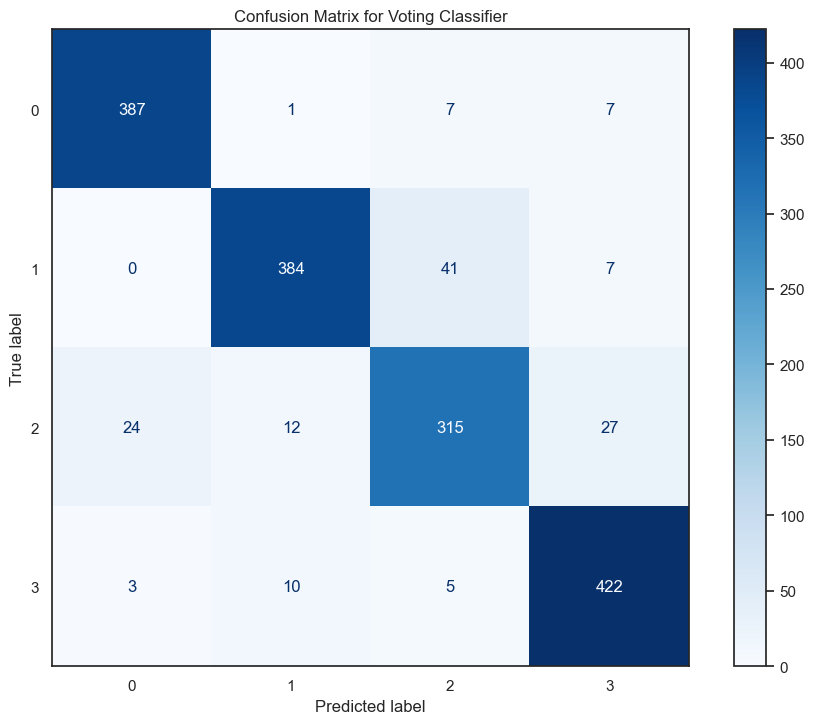

In [38]:
voting_model = VotingClassifier(estimators=[
    ('knn', best_knn_model),
    ('tree', tree_model),
    ('forest', rfc_model),
    ('ada', ada_model),
    ('grad', grad_model),
    ('xg', xg_model)
], voting='soft')
voting_model.fit(x_train, y_train)
y_pred_voting = voting_model.predict(x_test)

print(f"Voting Classifier Accuracy: {accuracy_score(y_test, y_pred_voting)}")
print(classification_report(y_test, y_pred_voting))
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_voting)).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Voting Classifier')
plt.show()

In [41]:
Model=best_knn_model

# Prompt the user for the image file path

In [52]:
from tkinter import Tk, Label, Button, filedialog, messagebox
from PIL import Image, ImageTk  # To handle images in Tkinter
from fpdf import FPDF           # To create the PDF report

def generate_pdf_report(image_path, prediction_result):
    """Generate a PDF report with the selected image, prediction result, and medical advice."""
    pdf = FPDF()
    pdf.add_page()
    pdf.set_font("Arial", size=12)

    # Insert the image into the PDF at the top
    pdf.image(image_path, x=50, y=100, w=100)  # Adjust `x`, `y`, and `w` for placement
    pdf.ln(10)  # Add some space after the image

    # Title after the image
    pdf.cell(200, 10, "Tumor Detection Prediction Report", ln=True, align="C")
    pdf.ln(10)  # Add some space after the title

    # Prediction result
    pdf.cell(200, 10, f"Prediction: {prediction_result}", ln=True, align="L")
    pdf.ln(10)  # Add some space after the prediction result

    # Medical advice based on prediction
    pdf.set_font("Arial", size=11)
    if prediction_result == "Glioma":
        pdf.cell(200, 10, "Advice: Consult with a neuro-oncologist for further evaluation.", ln=True)
        pdf.cell(200, 10, "Possible treatments include: surgery, radiation therapy, and chemotherapy.", ln=True)
    elif prediction_result == "Meningioma":
        pdf.cell(200, 10, "Advice: Monitor the condition closely; surgical removal may be required if symptomatic.", ln=True)
        pdf.cell(200, 10, "Medications may include corticosteroids to reduce swelling.", ln=True)
    elif prediction_result == "Pituitary":
        pdf.cell(200, 10, "Advice: Consider an endocrinologist consultation to assess hormonal effects.", ln=True)
        pdf.cell(200, 10, "Possible treatments: surgery or medication to control hormone levels.", ln=True)
    else:
        pdf.cell(200, 10, "Advice: No tumors detected. Maintain regular health check-ups.", ln=True)
        pdf.cell(200, 10, "Healthy lifestyle and diet are recommended for overall well-being.", ln=True)

    # Save the PDF
    pdf_output_path = "tumor_detection_report.pdf"
    pdf.output(pdf_output_path)
    messagebox.showinfo("PDF Report", f"Report saved as {pdf_output_path}")

# Function to load image and process it
def load_image():
    file_path = filedialog.askopenfilename(title="Select an Image File", 
                                           filetypes=[("Image Files", "*.jpg;*.jpeg;*.png")])
    
    if file_path:
        # Load the image using OpenCV
        image_test = cv2.imread(file_path)
        if image_test is not None:
            # Convert the image from BGR to RGB format
            image_rgb = cv2.cvtColor(image_test, cv2.COLOR_BGR2RGB)

            # Convert OpenCV image to PIL format
            image_pil = Image.fromarray(image_rgb)
            image_tk = ImageTk.PhotoImage(image_pil)

            # Display the image in the GUI
            image_label.config(image=image_tk)
            image_label.image = image_tk  # Keep a reference to avoid garbage collection

            # Extract features from the specified image
            features = extract_hog_features(file_path)
            if features is not None:
                features_list_1 = [features]  # Create a list for features
                features_array = np.array(features_list_1)

                # Convert features to DataFrame
                features_image = pd.DataFrame(features_array, columns=[f'feature_{i}' for i in range(features_array.shape[1])])

                # Handle outliers
                features_image = replace_outliers_with_median(features_image)

                # Make a prediction using the loaded model
                prediction = Model.predict(features_image)

                # Show the prediction result: 1 for glioma, 2 for meningioma, 0 for no tumor, 3 for pituitary
                if prediction[0] == 1:
                    result = "Glioma"
                elif prediction[0] == 2:
                    result = "Meningioma"
                elif prediction[0] == 3:
                    result = "Pituitary"
                else:
                    result = "Normal"

                # Update the result label with the prediction
                result_label.config(text=f"Tumor Prediction: {result}")

                # Generate PDF report with the image and prediction result
                generate_pdf_report(file_path, result)
            else:
                messagebox.showerror("Error", "Failed to extract features.")
        else:
            messagebox.showerror("Error", "Error loading image.")
    else:
        messagebox.showwarning("File Selection", "No file selected.")

# Setting up the Tkinter GUI
def run_gui():
    global image_label, result_label
    root = Tk()
    root.title("Tumor Detection Prediction")

    # Create a label to instruct the user
    instruction_label = Label(root, text="Select an image file to predict Tumor Detection.")
    instruction_label.pack(pady=10)

    # Create a button to load the image
    button = Button(root, text="Load Image", command=load_image)
    button.pack(pady=5)

    # Label to display the prediction result
    result_label = Label(root, text="Prediction result will appear here.")
    result_label.pack(pady=10)

    # Label to display the image
    image_label = Label(root)
    image_label.pack(pady=10)

    # Start the Tkinter main loop
    root.mainloop()

# Run the GUI
run_gui()
